# Seizure prediction
Try to setup code to sample data before a seizure occurs and see if i can't generalize to a class for later analysis

In [51]:
import sys, os
sys.path.append(os.path.realpath(".."))

import util_funcs
from importlib import reload
reload(util_funcs)
from copy import deepcopy as cp

import data_reader as read
import pandas as pd
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import pywt
import tsfresh.feature_extraction.feature_calculators as feats
import constants
import clinical_text_analysis as cta
reload(cta)
import tsfresh
import ensembleReader as er
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, roc_curve, r2_score
from os import path

reload(read)
import wf_analysis.datasets as wfdata
import wf_analysis.filters as filt
reload(filt)
from addict import Dict
import time
import pickle as pkl
import tsfresh.feature_extraction.feature_calculators as tsf
import pyedflib as edf

## Set up some scratch code for looking at seizure labels

### Pull an example annotation down and see what it looks like

In [9]:
allFiles = read.get_all_token_file_names("train", "01_tcp_ar")

In [10]:
allFiles[0]

'/home/ms994/v1.5.0/edf/train/01_tcp_ar/131/00013182/s001_2015_10_07/00013182_s001_t000.edf'

In [33]:
ann = read.read_tse_file(read.convert_edf_path_to_tse(allFiles[1300]))
ann

,start,end,label,p,duration
0,0,523.426,bckg,1,523.426
1,523.426,566.738,cpsz,1,43.3125
2,566.738,1203,bckg,1,636.262


In [46]:
reload(read)
partial_expand = read.expand_tse_file(ann, fully_expand=False)
partial_expand.loc[pd.Timedelta(seconds=520):pd.Timedelta(seconds=525)]

00:08:40    bckg
00:08:41    bckg
00:08:42    bckg
00:08:43    bckg
00:08:44    cpsz
00:08:45    cpsz
Freq: S, dtype: object

## Look at seizure labels

In [2]:
reload(read)
train_slr = read.SeizureLabelReader(split="train", return_tse_data=True, n_process=20)
dev_test_slr = read.SeizureLabelReader(split="dev_test", return_tse_data=True, n_process=20)
train_slr.verbosity = 1000
dev_test_slr.verbosity = 1000

In [3]:
allTrainLabels = train_slr[:]
allDevTestLabels = dev_test_slr[:]

Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000
Starting 20 processes
retrieving: 0


In [4]:
read.parse_edf_token_path_structure((train_slr.sampleInfo[3176]).token_file_path)[1]

'00008628'

In [13]:
reload(er)
eds = er.EdfDatasetSegments(use_rolling=True)

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


Compare the EDS segments generation based on which method we choose

In [16]:
eds = er.EdfDatasetSegments(use_rolling=False)
start = time.time()
train_labels = eds.get_train_split()
print(time.time()-start)
eds = er.EdfDatasetSegments(use_rolling=True)
start = time.time()
train_labels = eds.get_train_split()
print(time.time()-start)

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000
42.8083381652832
Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


KeyboardInterrupt: 

In [17]:
print(time.time()-start)

827.6829741001129


In [14]:
train_labels = eds.get_train_split()

In [7]:
for i, j  in train_labels[0][1].iteritems():
    print(i, j)

0 days 00:00:00 bckg
0 days 00:00:04 bckg
0 days 00:00:08 bckg
0 days 00:00:12 bckg
0 days 00:00:16 bckg
0 days 00:00:20 bckg
0 days 00:00:24 bckg
0 days 00:00:28 bckg
0 days 00:00:32 bckg
0 days 00:00:36 bckg
0 days 00:00:40 bckg
0 days 00:00:44 bckg
0 days 00:00:48 bckg
0 days 00:00:52 bckg
0 days 00:00:56 bckg
0 days 00:01:00 bckg
0 days 00:01:04 bckg
0 days 00:01:08 bckg
0 days 00:01:12 bckg
0 days 00:01:16 bckg
0 days 00:01:20 bckg
0 days 00:01:24 bckg
0 days 00:01:28 bckg
0 days 00:01:32 bckg
0 days 00:01:36 bckg
0 days 00:01:40 bckg
0 days 00:01:44 bckg
0 days 00:01:48 bckg
0 days 00:01:52 bckg
0 days 00:01:56 bckg
0 days 00:02:00 bckg
0 days 00:02:04 bckg
0 days 00:02:08 bckg
0 days 00:02:12 bckg
0 days 00:02:16 bckg
0 days 00:02:20 bckg
0 days 00:02:24 bckg
0 days 00:02:28 bckg
0 days 00:02:32 bckg
0 days 00:02:36 bckg
0 days 00:02:40 bckg
0 days 00:02:44 bckg
0 days 00:02:48 bckg
0 days 00:02:52 bckg
0 days 00:02:56 bckg
0 days 00:03:00 bckg
0 days 00:03:04 bckg
0 days 00:03:

0 days 01:00:16 bckg
0 days 01:00:20 bckg
0 days 01:00:24 bckg
0 days 01:00:28 bckg
0 days 01:00:32 bckg
0 days 01:00:36 bckg
0 days 01:00:40 bckg
0 days 01:00:44 bckg
0 days 01:00:48 bckg
0 days 01:00:52 bckg
0 days 01:00:56 bckg
0 days 01:01:00 bckg
0 days 01:01:04 bckg
0 days 01:01:08 bckg
0 days 01:01:12 bckg
0 days 01:01:16 bckg
0 days 01:01:20 bckg
0 days 01:01:24 bckg
0 days 01:01:28 bckg
0 days 01:01:32 bckg
0 days 01:01:36 bckg
0 days 01:01:40 bckg
0 days 01:01:44 bckg
0 days 01:01:48 bckg
0 days 01:01:52 bckg
0 days 01:01:56 bckg
0 days 01:02:00 bckg
0 days 01:02:04 bckg
0 days 01:02:08 bckg
0 days 01:02:12 bckg
0 days 01:02:16 bckg
0 days 01:02:20 bckg
0 days 01:02:24 bckg
0 days 01:02:28 bckg
0 days 01:02:32 bckg
0 days 01:02:36 bckg
0 days 01:02:40 bckg
0 days 01:02:44 bckg
0 days 01:02:48 bckg
0 days 01:02:52 bckg
0 days 01:02:56 bckg
0 days 01:03:00 bckg
0 days 01:03:04 bckg
0 days 01:03:08 bckg
0 days 01:03:12 bckg
0 days 01:03:16 bckg
0 days 01:03:20 bckg
0 days 01:03:

## Worked on pulling data based on seizure label

In [14]:
reload(er)
edss = read.Flattener(read.EdfFFTDatasetTransformer(er.EdfDatasetSegmentedSampler(segment_file_tuples=train_labels, num_samples=3000, max_bckg_samps_per_file=1, n_process=16, mode=er.EdfDatasetSegmentedSampler.PREDICT_MODE), freq_bins=[0,3.5,7.5,14,20,25,40], is_pandas_data=False,), n_process=16)
edss.verbosity=1000

In [11]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [15]:
data = edss[:]
x = [datum[0] for datum in data]
y = [datum[1] for datum in data]
smote = SMOTE(n_jobs=12)

Starting 16 processes
retrieving: 0
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

In [16]:
sum(y)/ len(y)

0.6836666666666666

In [12]:
x_res, y_res = smote.fit_resample(x, y)

In [13]:
sum(y_res) / len(y_res)

0.5

In [40]:
sum(y) / len(y)

0.8506666666666667

In [19]:
#get number of samples generated that make a bckg event
sum([edss.sampleInfo[i].label for i in range(len(edss))])

19753

In [20]:
len(edss)

117260

1462754

In [21]:
sum([train_labels[i][1].index.max()/pd.Timedelta(seconds=4) for i in range(len(train_labels))])

1470264.0

In [26]:
from time import time

In [27]:
start = time()
reload(read)
scratchData = read.Flattener(read.EdfFFTDatasetTransformer(edss, freq_bins=[0,3.5,7.5,14,20,25,40], is_pandas_data=False), n_process=20)
scratchData.verbosity=500
scratchData = scratchData[:]

Starting 20 processes
retrieving: 0
read 1000, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 1000, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less 

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less tha

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less tha

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less tha

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less 

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 req

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
retrieving: 3000
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 10

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 10

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
retrieving: 4500
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 reques

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 10

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 255, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reques

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 255, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 103

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!

read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

In [28]:
print(time() - start)

802.7979028224945


## Trying out imblearn to see if resampling data to deal with data imbalance can help here

In [ ]:
from imblearn.over_sampling import SMOTE

In [5]:
containsSeizures = []
for i, label in enumerate(allTrainLabels):
    if not (label.label == "bckg").all():
        containsSeizures.append(i)

In [6]:
len(containsSeizures)

458

In [7]:
seizureSubsetFiles = [train_slr.sampleInfo[i].token_file_path for i in containsSeizures]

In [8]:
cooldown = 5
possibleSampleTime = 20
print(allTrainLabels[containsSeizures[0]])
possibleSeizureTrainTimes = []
possibleNonseizureTrainTimes = []

     start      end label  p duration
0        0  62.6836  bckg  1  62.6836
1  62.6836  100.449  fnsz  1  37.7656
2  100.449      601  bckg  1  500.551


In [9]:
raw_ann = allTrainLabels[containsSeizures[200]]
raw_ann

,start,end,label,p,duration
0,0,1,bckg,1,1
1,1,125.372,fnsz,1,124.372
2,125.372,348.232,bckg,1,222.86
3,348.232,407.9,fnsz,1,59.668
4,407.9,766.256,bckg,1,358.356
5,766.256,982.256,fnsz,1,216
6,982.256,1062.27,bckg,1,80.016
7,1062.27,1234.17,fnsz,1,171.896
8,1234.17,1469.23,bckg,1,235.06
9,1469.23,1565.19,fnsz,1,95.964


In [26]:
reload(read)
reload(er)
new_ann = er.seizure_series_annotate_times(raw_ann)

In [21]:
new_ann.index[new_ann == "bckg"] / pd.Timedelta(seconds=1)

Float64Index([ 131.0,  132.0,  133.0,  134.0,  135.0,  136.0,  137.0,  138.0,
               139.0,  140.0,
              ...
              1988.0, 1989.0, 1990.0, 1991.0, 1992.0, 1993.0, 1994.0, 1995.0,
              1996.0, 1997.0],
             dtype='float64', length=1044)

## Seizure Label Comparison

In [2]:
train_pkl="/n/scratch2/ms994/trainSeizureData.pkl"
valid_pkl="/n/scratch2/ms994/validSeizureData.pkl"
test_pkl="/n/scratch2/ms994/testSeizureData.pkl"

In [3]:
trainData = pkl.load(open(train_pkl, "rb"))
validData = pkl.load(open(valid_pkl, "rb"))
testData = pkl.load(open(test_pkl, "rb"))

In [8]:
(trainData[1].sum() + validData[1].sum() + testData[1].sum())

36981

In [11]:

(trainData[1].sum() + validData[1].sum() + testData[1].sum())
(trainData[1].sum() + validData[1].sum() + testData[1].sum())
36981 / 118354

0.3124609223177924

In [10]:
len(trainData[1]) + len(validData[1]) + len(testData[1])

118354

## Try rolling window approach for generating labels and validate that preprocessing of labels worked

In [18]:
#reload data from section 1.1
allFiles = read.get_all_token_file_names("train", "01_tcp_ar")

allFiles[0]

ann = read.read_tse_file(read.convert_edf_path_to_tse(allFiles[1300]))
ann

reload(read)
partial_expand = read.expand_tse_file(ann, fully_expand=False)
partial_expand.loc[pd.Timedelta(seconds=520):pd.Timedelta(seconds=525)]

00:08:40    bckg
00:08:41    bckg
00:08:42    bckg
00:08:43    bckg
00:08:44    cpsz
00:08:45    cpsz
Freq: S, dtype: object

In [5]:
ann

,start,end,label,p,duration
0,0,523.426,bckg,1,523.426
1,523.426,566.738,cpsz,1,43.3125
2,566.738,1203,bckg,1,636.262


In [3]:
len(partial_expand)

1204

In [4]:
def generate_label_rolling_window(ann, cooldown=1, sample_time=1):
    partial_expand = read.expand_tse_file(ann, fully_expand=False)
    label_arr = pd.Series(index=partial_expand.index, dtype=str).fillna(0)
    def is_seiz_class(label):
        if type(label) == pd.Series:
            return label.apply(lambda data: "sz" in data)
        return "sz" in label
    for i, time_index in enumerate(partial_expand.index):
        if is_seiz_class(partial_expand[i]):
            label_arr[time_index] = "sz"
        elif is_seiz_class(partial_expand[partial_expand.index[max(0,i-cooldown):i-1]]).any():
            label_arr[time_index] = "postsz" # we had seizure in past, we can't use the following period for seizure prediction
        elif is_seiz_class(partial_expand.iloc[i:i+cooldown]).any():
            label_arr[time_index] = "presz" #cooldown period before seizure starts, we can't use this
        elif is_seiz_class(partial_expand.iloc[i+cooldown:i+cooldown+sample_time]).any():
            label_arr[time_index] = "sample" #seizure target
    return label_arr

In [7]:
generate_label_rolling_window(ann, cooldown=5, sample_time=5)

00:00:00    postsz
00:00:01         0
00:00:02         0
00:00:03         0
00:00:04         0
00:00:05         0
00:00:06         0
00:00:07         0
00:00:08         0
00:00:09         0
00:00:10         0
00:00:11         0
00:00:12         0
00:00:13         0
00:00:14         0
00:00:15         0
00:00:16         0
00:00:17         0
00:00:18         0
00:00:19         0
00:00:20         0
00:00:21         0
00:00:22         0
00:00:23         0
00:00:24         0
00:00:25         0
00:00:26         0
00:00:27         0
00:00:28         0
00:00:29         0
             ...  
00:19:34         0
00:19:35         0
00:19:36         0
00:19:37         0
00:19:38         0
00:19:39         0
00:19:40         0
00:19:41         0
00:19:42         0
00:19:43         0
00:19:44         0
00:19:45         0
00:19:46         0
00:19:47         0
00:19:48         0
00:19:49         0
00:19:50         0
00:19:51         0
00:19:52         0
00:19:53         0
00:19:54         0
00:19:55    

In [105]:
train_slr = read.SeizureLabelReader(split="train", return_tse_data=True, n_process=20)

In [59]:
eds = er.EdfDatasetSegments()

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


In [123]:
(er.seizure_series_annotate_times(ann, pre_cooldown=5, sample_time=5) == "sample").sum()

2

In [126]:
(generate_label_rolling_window(ann, cooldown=5, sample_time=5) == "sample").sum()

3

In [73]:
for i in range(len(allFiles)):
    ann = read.read_tse_file(read.convert_edf_path_to_tse(allFiles[i]))
    if (len(ann) > 5):
        print(i)
        break

        

71


### Add Rolling Window approach into the segment analysis

In [5]:
ann

,start,end,label,p,duration
0,0,523.426,bckg,1,523.426
1,523.426,566.738,cpsz,1,43.3125
2,566.738,1203,bckg,1,636.262


In [19]:
reload(er)
comp1=er.generate_label_rolling_window(ann, sample_time=20, pre_cooldown=5)
comp2=er.seizure_series_annotate_times(ann, sample_time=20, pre_cooldown=5)

In [21]:
print(comp1.loc[(comp1 == comp2)==False])
print(comp2.loc[(comp1 == comp2)==False])

00:08:19      bckg
00:08:39    sample
Freq: 20S, dtype: object
00:08:19    sample
00:08:39     presz
Freq: 20S, dtype: object


In [23]:
comp1.loc[pd.Timedelta(minutes=8, seconds=18):pd.Timedelta(minutes=8, seconds=25)]

00:08:18      bckg
00:08:19      bckg
00:08:20    sample
00:08:21    sample
00:08:22    sample
00:08:23    sample
00:08:24    sample
00:08:25    sample
Freq: S, dtype: object

In [24]:
comp2.loc[pd.Timedelta(minutes=8, seconds=18):pd.Timedelta(minutes=8, seconds=25)]

00:08:18      bckg
00:08:19    sample
00:08:20    sample
00:08:21    sample
00:08:22    sample
00:08:23    sample
00:08:24    sample
00:08:25    sample
Freq: S, dtype: object

In [30]:
8 * 60 + 19

499

In [8]:
er.seizure_series_annotate_times(ann)

00:00:00    bckg
00:00:01    bckg
00:00:02    bckg
00:00:03    bckg
00:00:04    bckg
00:00:05    bckg
00:00:06    bckg
00:00:07    bckg
00:00:08    bckg
00:00:09    bckg
00:00:10    bckg
00:00:11    bckg
00:00:12    bckg
00:00:13    bckg
00:00:14    bckg
00:00:15    bckg
00:00:16    bckg
00:00:17    bckg
00:00:18    bckg
00:00:19    bckg
00:00:20    bckg
00:00:21    bckg
00:00:22    bckg
00:00:23    bckg
00:00:24    bckg
00:00:25    bckg
00:00:26    bckg
00:00:27    bckg
00:00:28    bckg
00:00:29    bckg
            ... 
00:19:33    bckg
00:19:34    bckg
00:19:35    bckg
00:19:36    bckg
00:19:37    bckg
00:19:38    bckg
00:19:39    bckg
00:19:40    bckg
00:19:41    bckg
00:19:42    bckg
00:19:43    bckg
00:19:44    bckg
00:19:45    bckg
00:19:46    bckg
00:19:47    bckg
00:19:48    bckg
00:19:49    bckg
00:19:50    bckg
00:19:51    bckg
00:19:52    bckg
00:19:53    bckg
00:19:54    bckg
00:19:55    bckg
00:19:56    bckg
00:19:57    bckg
00:19:58    bckg
00:19:59    bckg
00:20:00    bc

# other feature types

In [47]:
import predictSeizureRF as psrf
reload(psrf)

<module 'predictSeizureRF' from '/home/ms994/dbmi_eeg_clustering/predictSeizureRF.py'>

In [27]:
eds = psrf.getDataSampleGenerator(5,5,5,1)

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


In [30]:
eds.func_call = er.seizure_series_annotate_times

In [31]:
train_label_files_segs = eds.get_train_split()

In [81]:
#set up parameters ahead of time
mode = er.EdfDatasetSegmentedSampler.DETECT_MODE
max_samples=None
max_bckg_samps_per_file = 20
n_process = 20
num_splits_per_sample=5

In [84]:
reload(er)
train_edss = er.EdfDatasetSegmentedSampler(segment_file_tuples=train_label_files_segs, mode=mode, num_samples=max_samples, max_bckg_samps_per_file=max_bckg_samps_per_file, n_process=n_process, gap=pd.Timedelta(seconds=1))

In [89]:
allLabels = [train_edss.sampleInfo[i].label for i in range(len(train_edss))]

In [90]:
sum(allLabels)

77050

In [92]:
len(allLabels)

126328

In [93]:
train_edss[20:40]

Starting 20 processes
retrieving: 20
retrieving: 30


[(array([[  0.48314244,   0.28267681,   3.06185939, ...,   0.92052195,
            0.45580623,   0.99341859],
         [  3.7154221 ,   2.25748398,  23.9728861 , ...,   6.71165109,
            3.26106019,   7.37352167],
         [ 12.60113635,   7.8533204 ,  79.72372788, ...,  21.74406613,
           10.62832542,  24.7154024 ],
         ...,
         [ -3.58028381,  -2.02357683,  -6.54620124, ..., -13.44855039,
            6.19955722,   5.74879169],
         [ -1.79018825,  -0.54471586, -25.62324432, ..., -11.81509205,
           11.34780759,  10.59283962],
         [ -1.4471297 ,   0.24739529,  20.71932572, ..., -11.43074333,
            8.13858259,  14.80188952]]), False),
 (array([[  0.73828053,   0.78384089,   1.71327232, ...,   0.76561675,
            0.61071147,   0.78384089],
         [  5.16176492,   5.39660926,  11.51415291, ...,   5.29720428,
            4.30191226,   5.34193676],
         [ 16.03315212,  16.48370967,  33.33821576, ...,  16.23448325,
           13.6946192 ,  

In [ ]:
allData = train_edss[:]

In [45]:
labels = [datum[1] for datum in allData]

In [46]:
allData[0][0].shape

(250, 21)

In [69]:
from wf_analysis import datasets
reload(datasets)

<module 'wf_analysis.datasets' from '/home/ms994/dbmi_eeg_clustering/wf_analysis/datasets.py'>

In [78]:
shed = datasets.SimpleHandEngineeredDataset(allData, n_process=8, is_pandas_data=False, features=[tsf.abs_energy, tsf.sample_entropy, lambda x: tsf.number_cwt_peaks(x, int(constants.COMMON_FREQ/25))], f_names=["abs_energy", "approx_entropy", "num_peaks"], )

In [79]:
shed[0]

,abs_energy,approx_entropy,num_peaks
0,1.857857e+09,0.463452,5
1,1.644817e+09,0.414664,4
2,1.706828e+09,0.463656,5
3,1.901835e+09,0.453896,4
4,1.683875e+09,0.463554,5
5,2.517625e+09,0.463247,5
6,2.706836e+09,0.462686,5
7,2.875384e+09,0.472378,3
8,1.721531e+09,0.463656,5
9,2.316333e+09,0.473512,4


# Seizure Medication Labels

In [2]:
all_token_fns = read.get_all_token_file_names("train", "01_tcp_ar")

In [3]:
#keep only the first token from each session
all_token_fns = filter(lambda x: "t000" in x, all_token_fns)

In [4]:
allClinicalNotes = [cta.get_all_clinical_notes(fn) for fn in all_token_fns]

In [5]:
allData = []
for clinical_note in allClinicalNotes:
#     try:
        headings = re.findall(r'(\w+):', clinical_note.lower())

        data = clinical_note
        splitData = data

        splitSections = Dict()

        oldHeading = "all"

        for i, heading in enumerate(headings):
            data = data.lower().split(heading +":")
            if len(data) > 1:
                data = data[1]
            else:
                data = data[0]
            if i != len(headings) - 1:
                splitSections[heading] = data.lower().split(headings[i+1])[0].replace("\t", "").replace("\n", "")
        if "medications" in splitSections:
            splitSections.medications = splitSections.medications.split(",")
        elif "medicines" in splitSections:
            splitSections.medications = splitSections.medicines.split(",")
        splitSections.medications = [med.replace("and", " ").replace("."," ").strip() for med in splitSections.medications]
        allData.append(splitSections)
#     except Exception as e:
#         print(clinical_note)
#         print(e)
#         break

NameError: name 're' is not defined

In [144]:
from collections import Counter

In [165]:
allHeaders = []
for dataDict in allData:
    allHeaders += (list(dataDict.keys()))

In [169]:
Counter(allHeaders).most_common()

[('medications', 615),
 ('history', 599),
 ('record', 456),
 ('introduction', 451),
 ('impression', 395),
 ('to', 218),
 ('findings', 170),
 ('seizures', 129),
 ('type', 122),
 ('hr', 118),
 ('sedation', 110),
 ('technique', 110),
 ('description', 104),
 ('study', 100),
 ('discharges', 97),
 ('difficulties', 76),
 ('rate', 67),
 ('background', 64),
 ('2', 60),
 ('recording', 55),
 ('events', 55),
 ('1', 53),
 ('for', 51),
 ('11', 48),
 ('12', 46),
 ('3', 45),
 ('correlation', 41),
 ('8', 40),
 ('10', 39),
 ('activity', 39),
 ('detections', 36),
 ('eeg', 35),
 ('9', 34),
 ('6', 34),
 ('4', 33),
 ('5', 32),
 ('7', 30),
 ('sleep', 29),
 ('time', 28),
 ('procedures', 25),
 ('diagnosis', 23),
 ('aeds', 22),
 ('evaluation', 22),
 ('eegs', 22),
 ('date', 20),
 ('features', 19),
 ('conclusion', 17),
 ('05', 16),
 ('factors', 16),
 ('baseline', 16),
 ('pushbuttons', 16),
 ('08', 14),
 ('20', 11),
 ('pmhx', 11),
 ('seizure', 11),
 ('16', 10),
 ('06', 10),
 ('semiology', 10),
 ('event', 10),
 ('e

In [143]:
listOfMeds = []
for dataDict in allData:
    keys = dataDict.keys()
    for key in keys:
        if "medication" in key.lower():
            listOfMeds.append(dataDict[key])

In [170]:
listOfDesc = []
for dataDict in allData:
    keys = dataDict.keys()
    for key in keys:
        if "history" in key.lower():
            listOfDesc.append(dataDict[key])            
        elif "description" in key.lower():
            listOfDesc.append(dataDict[key])
        elif "background" in key.lower():
            listOfDesc.append(dataDict[key])

In [171]:
len(listOfDesc)

767

In [145]:
c = Counter()
for miniList in listOfMeds:
    c.update(miniList)

In [147]:
import seaborn as sns
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 600

Text(0.5, 0, 'Session Count')

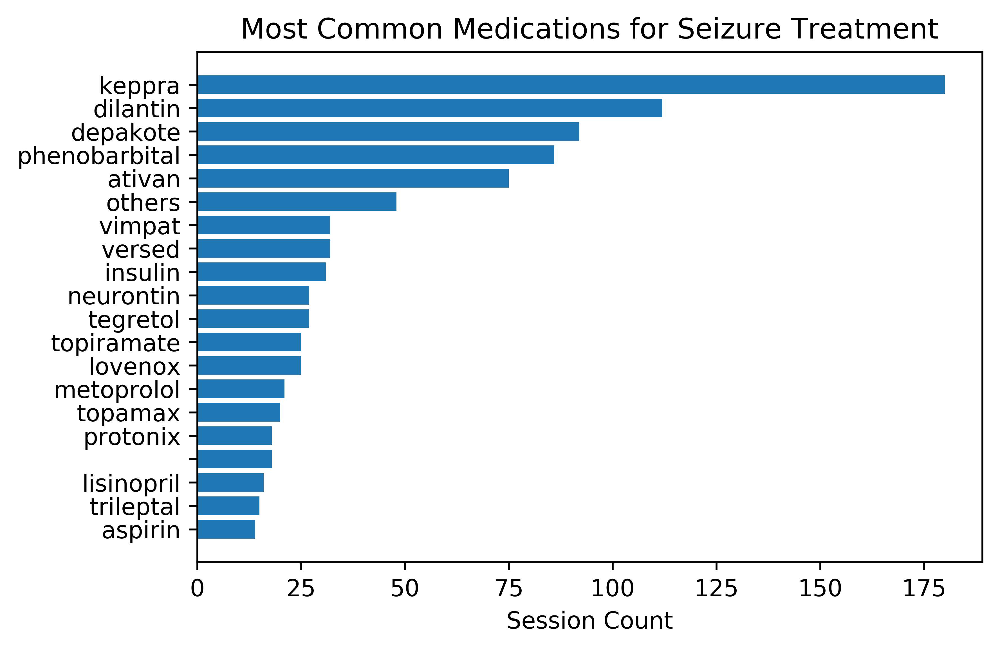

In [149]:
medCountTuples = c.most_common()[0:20]
# fig = plt.figure(figsize=(12,12))
plt.barh(list(reversed([medName for medName, val in medCountTuples])), list(reversed([val for medName, val in medCountTuples])))
plt.title("Most Common Medications for Seizure Treatment")
plt.xlabel("Session Count")

In [153]:
import sklearn.feature_extraction.text

In [250]:
tfidf_obj = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.2, min_df=0.1)

In [251]:
tfidf_obj = tfidf_obj.fit(listOfDesc)
len(tfidf_obj.vocabulary_)

28

568

In [252]:
transformed_matrix = tfidf_obj.transform(tfidf_obj.vocabulary_)

In [240]:
from sklearn.decomposition import PCA, FastICA

In [253]:
pca = PCA().fit(transformed_matrix.todense())

In [254]:
pca.explained_variance_ratio_[0:10]

array([0.03703704, 0.03703704, 0.03703704, 0.03703704, 0.03703704,
       0.03703704, 0.03703704, 0.03703704, 0.03703704, 0.03703704])

In [186]:
tfidf_obj.stop_words_

{'acom',
 'mixed',
 'spontaneous',
 'chair',
 '___',
 'dropping',
 'simple',
 'unable',
 'lowvoltage',
 'cell',
 'f4',
 'zonisamide',
 'freeuntil',
 'sedation',
 'alphaactivity',
 '30year',
 'nonepileptic',
 'major',
 'bactrim',
 'seizing',
 'overriding',
 '64',
 'residual',
 'dependence',
 'rightcarotid',
 'tirda',
 'followshyperventilation',
 'lady',
 'pleds',
 '45',
 'cerebellar',
 'pronounced',
 'falling',
 'prominence',
 'resulting',
 'beginning',
 'radiotherapy',
 'notable',
 '1998',
 'paroxysmal',
 'mentally',
 'sometimes',
 'sclerosis',
 'poorap',
 'impaired',
 'transitions',
 'butweak',
 'vertexwaves',
 'discharged',
 'semiology',
 'transient',
 'postprocedure',
 'what',
 'xr',
 '1he',
 'pregnant',
 'pattern',
 'when',
 'q12h',
 'blinking',
 'pe',
 'syncopalepisode',
 'leg',
 'preserved',
 'somewhat',
 'ongoing',
 'lift',
 'andk',
 'stomach',
 'kno',
 'zns',
 'extracranial',
 'digital',
 'nosewiping',
 'told',
 'inamplitude',
 'bitter',
 '17',
 'transients',
 '100mg',
 'bleed'